# Drugi domaći zadatak iz Digitalne obrade slike
### Autor: Martin Cvijović 558/2017



In [1]:
# Potrebni paketi
from pylab import *
#%matplotlib inline

import skimage
from skimage import *

import numpy as np

### Zadatak 1

1.1 Učitavanje i prikaz originalne slike i spektra

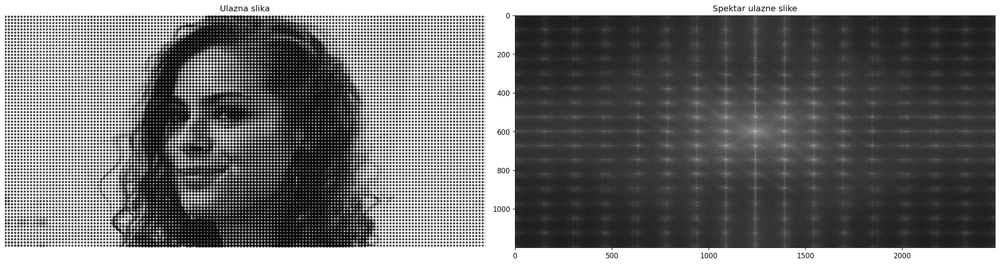

In [2]:
f = img_as_float(imread('../sekvence/girl_ht.tif'))
F = fftshift(fft2(f))

fig, axes = plt.subplots(ncols=2, figsize=(20,16), dpi=120)
ax = axes.ravel()

ax[0].imshow(f, cmap='gray'); ax[0].axis('off'); ax[0].set_title('Ulazna slika')
ax[1].imshow(log(1+abs(F)), cmap='gray'); ax[1].set_title('Spektar ulazne slike')

plt.tight_layout()
plt.show()

Najveći deo šuma se može potisnuti low pass filtriranjem. Međutim, ukoliko je opseg low pass filtra previše širok, neće se potisnuti sve komponente šuma. S druge strane, ukoliko je opseg low pass filtra previše uzak, filtar će biti previše jak i isfiltriraće većinu detalja slike, što bi značajno zamutilo sliku.

Dobro rešenje bi bilo kombinovati low pass filtar sa cnotch filtrom. Cnotch filtar se sastoji iz frekvencijski pomerenih kombinacija low pass i high pass filtara, u zavisnosti od toga da se filtar koristi kao skup band pass filtara ili kao skup band stop filtara. Filtar se koristi tako što se specificiraju koordinate u spektru komponente (ili više komponenata) koju želimo da izdvojimo ili uklonimo. Zanimljiva osobina filtra je činjenica da za svaki od kreiranih filtara kreira se centralno simetričan filtar u spektru, što se pokazuje jako korisnim u primeru koji posmatramo. 

1.2 Definisanje funkcija za low pass i cnotch filtriranje

In [3]:
def lpfilter(filt_type, M, N, sigma, n=1):
    
    if (M%2 == 0):
        y = np.arange(0,M) - M/2 + 0.5
    else:
        y = np.arange(0,M) - (M-1)/2
    
    if (N%2 == 0):
        x = np.arange(0,N) - N/2 + 0.5
    else:
        x = np.arange(0,N) - (N-1)/2
    
    X, Y = meshgrid(x, y)
    
    # Matrica distanci od centra (koristi se u dva od tri ponudjena tipa funkcije - gaussian i butterworth)
    D = np.sqrt(np.square(X) + np.square(Y))
    
    if filt_type == 'gaussian':
        filter_mask = exp(-np.square(D) / (2*np.square(sigma)))
    elif filt_type == 'btw':
        filter_mask = 1/(1+(D/sigma)**(2*n))
    elif filt_type == 'ideal':
        filter_mask = ones([M, N])
        filter_mask[D > sigma] = 0
    else:
        print('Filter ', filt_type, ' nije podrzan.')
        return
        
    return filter_mask

In [4]:
def cnotch(filt_type, notch, M, N, C, r, n=1):
    N_filters = len(C)
    
    filter_mask = zeros([M, N])
    
    if (M%2 == 0):  
        y = np.arange(0, M) - M/2 + 0.5
    else:
        y = np.arange(0, M) - (M-1)/2
        
    if (N%2 == 0):
        x = np.arange(0, N) - N/2 + 0.5
    else:
        x = np.arange(0, N) - (N-1)/2
    
    X, Y = meshgrid(x, y)
    
    for i in range(0, N_filters):
        C_current = C[i]
        
        C_complement = zeros([2, 1])
        C_complement[0] = -C_current[0]
        C_complement[1] = -C_current[1]
        
        if (M%2 == 0):  
            y0 = y - C_current[0] + M/2 - 0.5
        else:
            y0 = y - C_current[0] + (M-1)/2
            
        if (N%2 == 0):  
            x0 = x - C_current[1] + N/2 - 0.5
        else:
            x0 = x - C_current[1] + (N-1)/2
        
        X0, Y0 = meshgrid(x0, y0)
        D0 = np.sqrt(np.square(X0) + np.square(Y0))
         
        if (M%2 == 0):  
            y0c = y - C_complement[0] - M/2 - 0.5
        else:
            y0c = y - C_complement[0] - (M-1)/2
            
        if (N%2 == 0):  
            x0c = x - C_complement[1] - N/2 - 0.5
        else:
            x0c = x - C_complement[1] - (N-1)/2
        
        X0c, Y0c = meshgrid(x0c, y0c)
        D0c = np.sqrt(np.square(X0c) + np.square(Y0c))
        
        if filt_type == 'gaussian':
            filter_mask = filter_mask + exp(-np.square(D0) / (2*np.square(r))) + exp(-np.square(D0c) / (2*np.square(r)))
        elif filt_type == 'btw':
            filter_mask = filter_mask + 1/(1+(D0/r)**(2*n)) + 1/(1+(D0c/r)**(2*n))
        elif filt_type == 'ideal':
            filter_mask[(D0 <= r)|(D0c<=r)] = 1     
        else:
            print('Filter ', filt_type, ' nije podrzan.')
            return
    
    if notch == 'pass':
        return filter_mask
    elif notch == 'reject':
        return 1 - filter_mask
    else:
        return
    

1.3 Filtriranje low pass filtrom i prikaz međurezultata

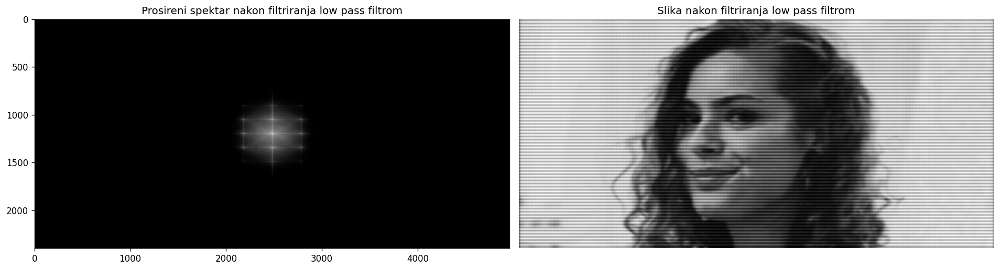

In [5]:
[M, N] = shape(f)

# Prosirivanje slike da ne bi doslo do image wrapping efekta
P = 2*M - 1 
Q = 2*N - 1
f_extended = zeros([P, Q])
f_extended[0:M, 0:N] = f

# FFT i filtriranje
F_extended = fftshift(fft2(f_extended))

H_lowpass = lpfilter('gaussian', P, Q, 110)
G_extended = F_extended * H_lowpass

# IFFT
g_extended = real(ifft2(ifftshift(G_extended)))
g_lp = g_extended[0:M, 0:N]
g_lp[g_lp < 0] = 0
g_lp[g_lp > 1] = 1

fig, axes = plt.subplots(ncols=2, figsize=(16,16), dpi=120)
ax = axes.ravel()

ax[0].imshow(log(1+abs(G_extended)), cmap='gray'); ax[0].set_title('Prosireni spektar nakon filtriranja low pass filtrom')
ax[1].imshow(g_lp, cmap='gray'); ax[1].axis('off'); ax[1].set_title('Slika nakon filtriranja low pass filtrom')

plt.tight_layout()
plt.show()

Na slici se primećuje značajno poboljšanje, međutim, ostalo je još 10 komponenata šuma koji se vide u spektru. Pomoću funkcionalnosti widget biblioteke matplotlib locirane su koordinate u spektru komponenata šuma i smeštene u niz C.

1.4 Filtriranje cnotch filtrom i prikaz konačnog rezultata

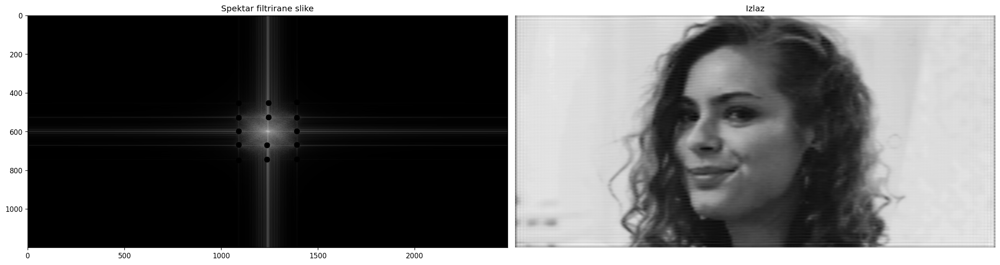

In [6]:
C = [[450, 1390], [530, 1390], [600, 1390], [670, 1390], [745, 1390], [528, 1244], [454, 1244]]

# Filtriraju se komponente na koordinatama date u nizu C u radijusu 15
H_notch = cnotch('ideal', 'reject', M, N, C, 15)

G_lp = fftshift(fft2(g_lp)) 

# figure(); imshow(log(1+abs(G_lp)), cmap='gray'); plt.show()

G = G_lp * H_notch

g = real(ifft2(ifftshift(G)))
g[g > 1] = 1
g[g < 0] = 0

fig, axes = plt.subplots(ncols=2, figsize=(20,16), dpi=120)
ax = axes.ravel()

ax[0].imshow(log(1+abs(G)), cmap='gray'); ax[0].set_title('Spektar filtrirane slike')
ax[1].imshow(g, cmap='gray'); ax[1].axis('off'); ax[1].set_title('Izlaz')

plt.tight_layout()
plt.show()

### Zadatak 2

2.1 Učitavanje i prikaz originalne slike

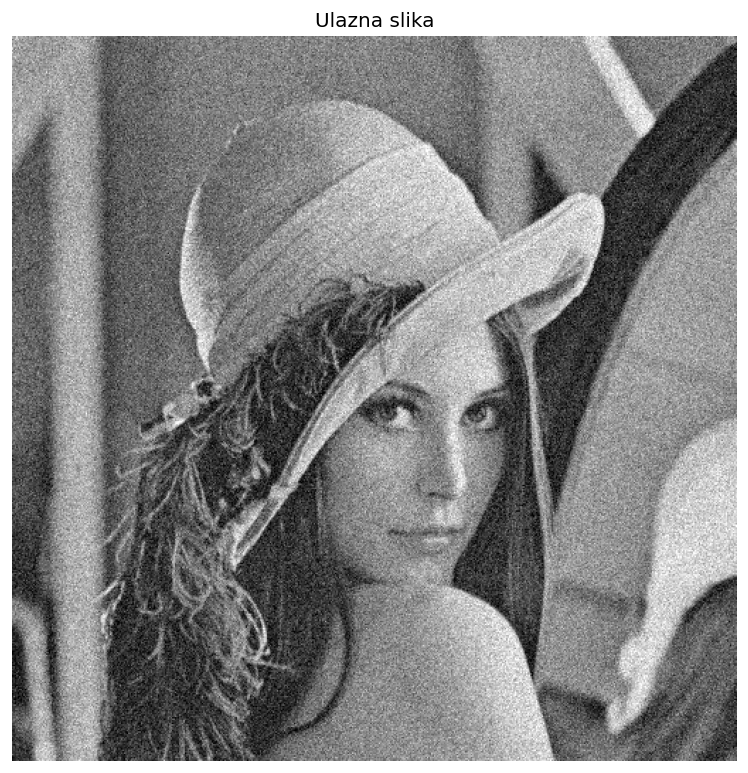

In [7]:
f = img_as_float(imread('../sekvence/lena_noise.tif'))

figure(figsize=(16,8), dpi=120); imshow(f, cmap='gray'); gca().set_title('Ulazna slika'); gca().axis('off')
plt.show()

Potrebno je odrediti varijansu (kvadrat standardne devijacije) šuma koji pogađa ovu sliku.

Prvi korak u estimaciji parametara šuma je nalaženje što veće uniformne površine na slici i naći standardnu devijaciju i varijansu te uniformne površine. Ideja je izdvojiti šum iz što veće i uniformnije površine na slici jer će u tom slučaju detalji slike imati minimalan uticaj na dobijenu varijansu i standardnu devijaciju, čime će standardna devijacija i varijansa šuma te površine biti približno jednaka varijansi šuma i standardnoj devijaciji šuma cele slike.

Potrebno je varirati lokalnu varijansu susedstva (2r+1)x(2r+1) u opsegu r=[1, 20] i posmatrati histogram lokalnih varijansi.

Što se tiče histograma lokalnih varijansi, što je radius r manji, regioni zahvaćeni tim opsegom će biti uniformniji, odnosno biće veća verovatnoća da je zahvaćen uniformni deo slike. Međutim, tada je na raspolaganju mali broj piksela i procena varijanse šuma je neprecizna. Ukoliko radius r raste, histogram će se izoštravati jer će procena varijanse šuma biti dosta preciznija, međutim, varijanse svakog od opsega će biti dosta sličnije i pojavljivaće se velike vrednosti u histogramu. Ukoliko nastavljamo da povećavamo radius, histogram će težiti velikom broju velikih vrednosti varijansi (varijanse velikih prozora će biti sličnije).

In [8]:
# Potreban paket za računanje korelacije 
from scipy import ndimage

3.1 Funkcija denoise_adaptive(img, r, show_results='false') računa lokalnu varijansu slike u zadatom radiusu (2r+1)x(2r+1). Računa se histogram lokalne varijanse čija maksimalna vrednost predstavlja varijansu šuma slike, na osnovu koje se na slici primenjuje adaptivno filtriranje. Korisniku je omogućeno da proveri histogram slike radi potencijalne promene radiusa i preciznijeg izračunavanja varijanse šuma, setovanjem argumenta show_results na vrednost True. 

In [9]:
def denoise_adaptive(img, r, show_results=False):
    
    h_avg = ones([2*r+1,2*r+1])/(2*r+1)**2
    
    ################# Računanje lokalne varijanse i histograma ###################
    
    img_avg = ndimage.correlate(img, h_avg)         # srednja vrednost u radius okolini
    img_sqr_avg = ndimage.correlate(img**2, h_avg)  # srednja vrednost kvadrata u radius okolini
    img_local_var = img_sqr_avg - img_avg**2        # lokalna varijansa slike
    
    hist, bins = np.histogram(img_local_var, bins=255, range=(0, 0.04))
    
    # Traženje pika histograma : skaliramo poziciju u indeksu sa odgovarajućom skalom na histogramu
    var_est = np.argmax(hist) * 0.04 / 255 
    
    ################ Adaptivno filtriranje ################
    
    # Težinska funkcija
    w = var_est/img_local_var
    w[w > 1] = 1
    w[w < 0] = 0
    
    img_out = img + w*(img_avg - img)
    
    ################# Prikaz rezultata #################
    
    if (show_results):
        
        print('Varijansa suma za prozor ' + str(2*r+1) + 'x' + str(2*r+1) + ': ' + str(round(var_est, 4)))
        print('Standardna devijacija za prozor ' + str(2*r+1) + 'x' + str(2*r+1) + ': ' + str(round(np.sqrt(var_est), 4)))
        
        fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(32,24), dpi=120)
        ax = axes.ravel()
        
        ax[0].imshow(img, cmap='gray'); ax[0].set_title('Ulazna sika'); ax[0].axis('off')
        ax[1].imshow(img_local_var, cmap='coolwarm'); ax[1].set_title('Lokalna varijansa za prozor ' + str(2*r+1) + 'x' + str(2*r+1)); ax[1].axis('off')
        ax[2].bar(bins[0:-1], hist, width=0.00005); ax[2].set_title('Histogram lokalne varijanse za prozor ' + str(2*r+1) + 'x' + str(2*r+1))
        ax[3].imshow(w, cmap='gray'); ax[3].set_title('Mapa tezina'); ax[3].axis('off')
        ax[4].imshow(img_out, cmap='gray'); ax[4].set_title('Izlazna slika'); ax[4].axis('off')
        ax[5].axis('off')
        
        plt.tight_layout()
        plt.show()
        
    return img_out

Varijansa suma za prozor 15x15: 0.0074
Standardna devijacija za prozor 15x15: 0.0859


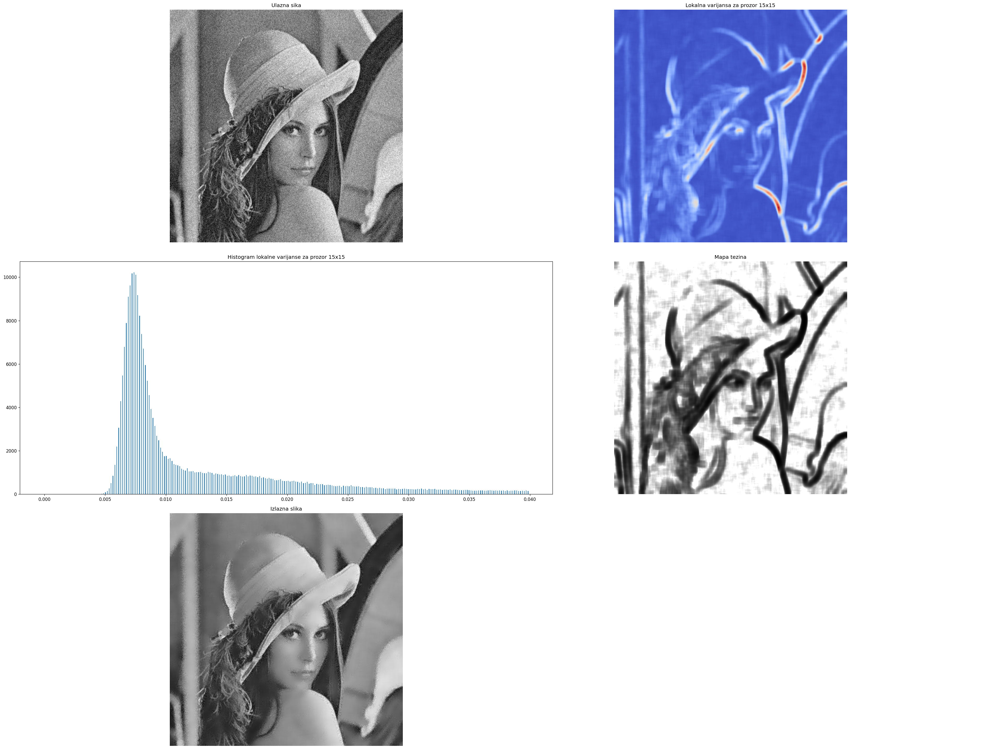

In [10]:
# Primer funkcionalnosti funkcije denoise_adaptive sa setovanim parametrom show_results na True
out_example = denoise_adaptive(f, 7, True)

Varijacijom parametra r u opsegu [1, 20] sa korakom 3, primećuje se da estimirana varijansa šuma za velike radijuse teži vrednosti 0.075. Karakteristične izlazne slike za neke odabrane vrednosti parametra r prikazane su na sledećoj slici:

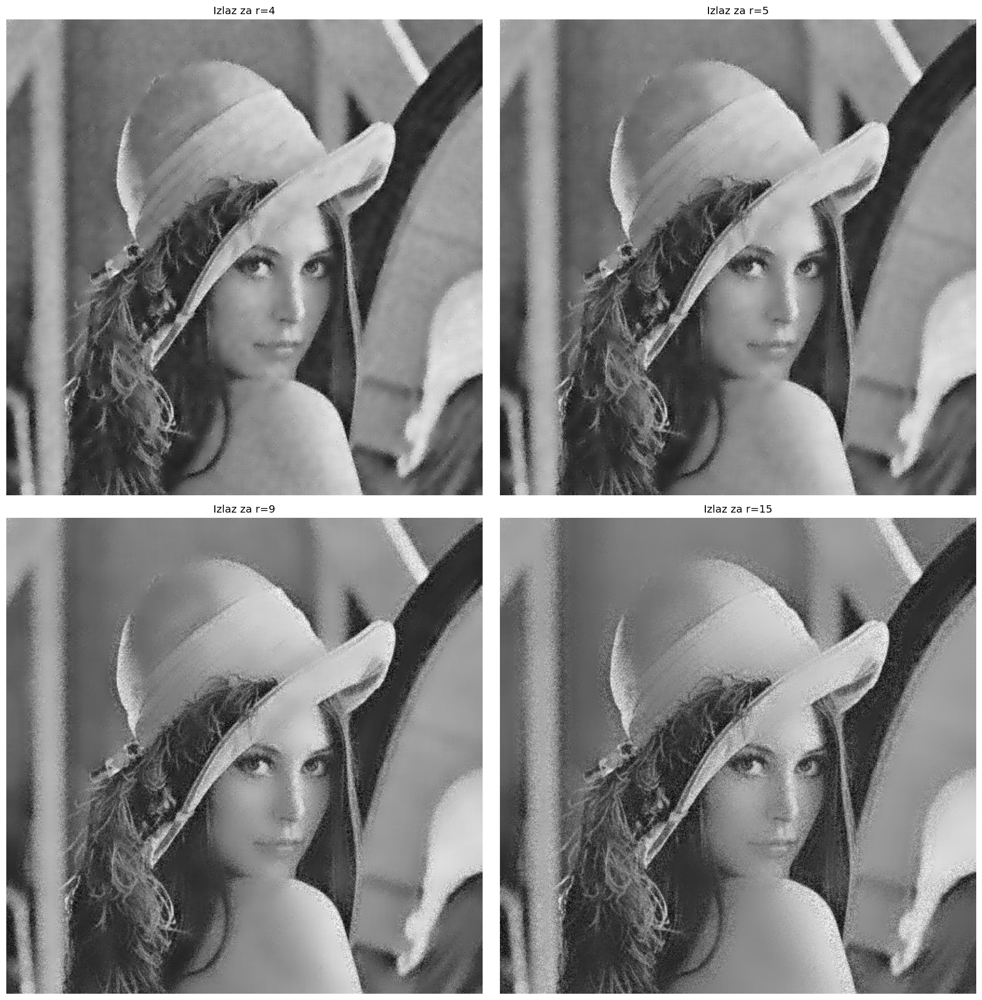

In [11]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16,16), dpi=120)
ax = axes.ravel()

ax[0].imshow(denoise_adaptive(f,4), cmap='gray'); ax[0].set_title('Izlaz za r=4'); ax[0].axis('off')
ax[1].imshow(denoise_adaptive(f,5), cmap='gray'); ax[1].set_title('Izlaz za r=5'); ax[1].axis('off')
ax[2].imshow(denoise_adaptive(f,9), cmap='gray'); ax[2].set_title('Izlaz za r=9'); ax[2].axis('off')
ax[3].imshow(denoise_adaptive(f,15), cmap='gray'); ax[3].set_title('Izlaz za r=15'); ax[3].axis('off')

plt.tight_layout()
plt.show()

Za r=5 dobija se optimalna vrednost radijusa u čijem krugu se traži lokalna varijansa. Estimirana varijansa šuma iznosi 0.0072. Za manje vrednosti radijusa filtar nema efekat dok se za velike vrednosti radijusa gube detalji slike.

#### Zadatak 3

Algoritam za rešavanje trećeg zadatka se ogleda u modelovanju degradacione funkcije (model funkcija koja bi konvolucijom sa originalnom slikom uzrokovala identično oštećenje) i, na osnovu informacije o degradaciji, izvršiti inverzno ili Vinerovo filtriranje. Na raspolaganju nam je informacija da se degradaciona funkcija može modelirati Gausovom funkcijom, kao i da je ta funkcija identična za sve tri komponente boje R, G i B.

3.1 Učitavanje i prikaz originalne slike i spektra

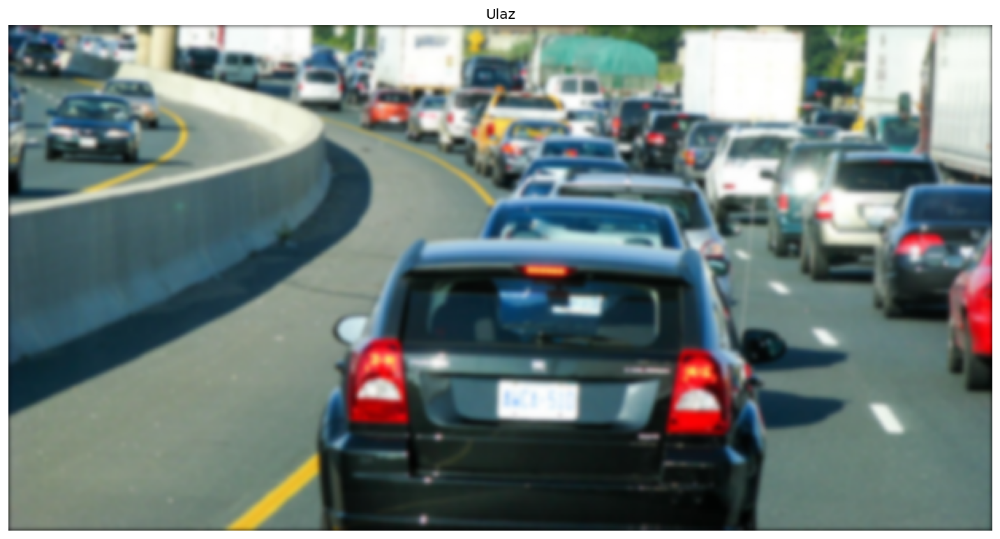

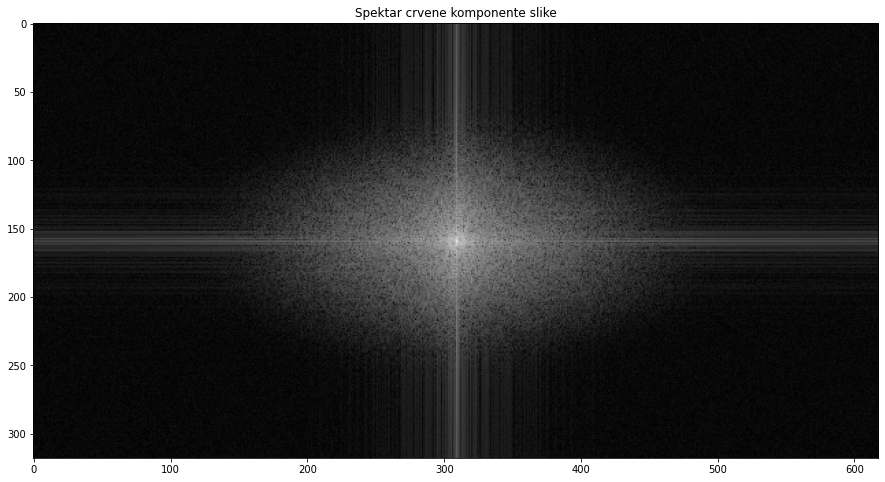

In [12]:
f = img_as_float(imread('../sekvence/road_blur.png'))

figure(figsize=(16,8), dpi=120); imshow(f, cmap='jet'); gca().axis('off'); gca().set_title('Ulaz')
plt.show()

figure(figsize=(16,8)); imshow(log(1+abs(fftshift(fft2(f[:,:,0])))), cmap='gray'); gca().set_title('Spektar crvene komponente slike')
plt.show()

Spektar slike ima velike sličnosti sa spektrom slike koja je filtrirana Gausovim low pass filtrom (dodatno, jako sličan spektar se dobija u prvom zadatku upravo nakon filtriranja Gausovim low pass filtrom). Ovo dodatno potvrđuje činjenica da je cela slika zamućena, odnosno da su visoke učestanosti potisnute. 

Funkcija threshold_lowpass(IMG) je funkcija za automatsku detekciju granice visokofrekventnog šuma. Pokazuje se jako preciznom kod inverzno filtriranih slika kod kojih se vrlo često taj visokofrekventni šum jako pojača.

In [13]:
from scipy import stats

def threshold_lowpass(IMG):
    [M, N] = shape(IMG)
    
    #figure(); imshow(log(1+abs(IMG)), cmap='gray'); plt.show()
    
    x = np.arange(0, M)
    y = np.arange(0, N)
    IMG_NP = np.zeros((x.size, y.size))
    IMG_NP[:,:] = abs(IMG[:,:])
    
    center_x = M//2
    center_y = N//2

    # avg_r[x] predstavlja srednju vrednost intenziteta u spektru u radijusu od [0, x] od centra spektra. 
    avg_r = zeros(max(M,N)//2)
    avg_r[0] = IMG_NP[center_x, center_y]
    
    for radius in range(1, max(M,N)//2):
        mask = (y[np.newaxis,:]-center_y)**2 + (x[:,np.newaxis]-center_x)**2 < radius**2
        avg_r[radius] = np.mean(IMG_NP[mask])
        
    # Očekujemo inverzno filtriranu funkciju koja ima jako izražen VF šum. Od najviših učestanosti se spuštamo ka nižim
    # sve dok magnituda ne krene da raste.
    for curr in range(max(M,N)//2-2, 0, -1):
        if avg_r[curr] > avg_r[curr+1]:
            return avg_r[0:-2], curr
    return avg_r, -1


3.2 Formiranje funkcije za inverzno/Vinerovo filtriranje

In [14]:
def restore_degradation(img, F_DEG, rest_type, k=1e-4, show_results=False):
    [M, N] = shape(img)
    
    IMG = fftshift(fft2(img))
    
    # Inverzno filtriranje
    IMG_INV = IMG / F_DEG

    # Očekuje se i low pass / wiener filtriranje zato što je šum jako pojačan. Međutim, potrebno bi bilo proslediti još jedan argument
    # za taj filtar. Hajde da to detektujemo automatski :)

    img_inv = real(ifft2(ifftshift(IMG_INV)))
    img_inv[img_inv > 1] = 1
    img_inv[img_inv < 0] = 0

    avg_r, threshold = threshold_lowpass(IMG_INV)
    
    if rest_type == 'ideal':
        if threshold > 0:
            H_LP = lpfilter('ideal', M, N, threshold)

            IMG_OUT = IMG_INV * H_LP
            img_out = real(ifft2(ifftshift(IMG_OUT)))
            img_out[img_out > 1] = 1
            img_out[img_out < 0] = 0
        else:
            img_out = img_inv
            IMG_OUT = fftshift(fft2(img_inv))
    
    elif rest_type == 'wiener':
        
        # TODO : Skalirati nadjen prag za idealni filtar tako da Vinerov filtar ima isti opseg
        
        W = (abs(F_DEG)**2)/(abs(F_DEG)**2 + k) # Vinerov filtar

        IMG_OUT = IMG_INV*W
        img_out = real(ifft2(ifftshift(IMG_OUT)))
        img_out[img_out < 0] = 0
        img_out[img_out > 1] = 1
    else:
        print ('Restauracija tipa ' + rest_type + ' nije podrzana.')
        return
        
    if (show_results):
        fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(16,8), dpi=120)
        ax = axes.ravel()
        
        ax[0].imshow(log(1+abs(IMG)), cmap='gray'); ax[0].set_title('Spektar ulazne slike')
        ax[1].imshow(log(1+abs(F_DEG)), cmap='gray'); ax[1].set_title('Spektar degradacione funkcije')
        ax[2].imshow(log(1+abs(IMG_INV)), cmap='gray'); ax[2].set_title('Spektar inverzno filtrirane slike')
        ax[3].plot(avg_r); ax[3].set_title('Detektovan prag za low pass: ' + str(threshold)); ax[3].set_xlabel('radius'); ax[3].set_ylabel('Srednji intenzitet')
        ax[4].imshow(log(1+abs(IMG_OUT)), cmap='gray'); ax[4].set_title('Spektar ' + rest_type + ' filtrirane slike')
        ax[5].imshow(log(1+abs(img_out)), cmap='gray'); ax[5].set_title('Izlazna slika')
        
        plt.tight_layout()
        plt.show()
    
    return img_out
        

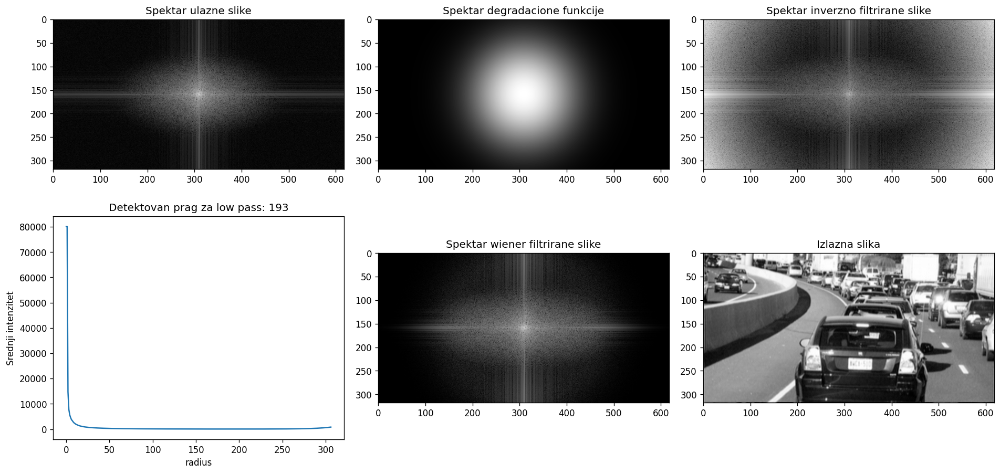

In [15]:
# def lpfilter(filt_type, M, N, sigma, n=1):

[M, N, K] = shape(f)

F_DEG = lpfilter('gaussian', M, N, 70)
out = restore_degradation(f[:,:,0], F_DEG, 'wiener', 0.01, True) # dev : 70, k = 0.01

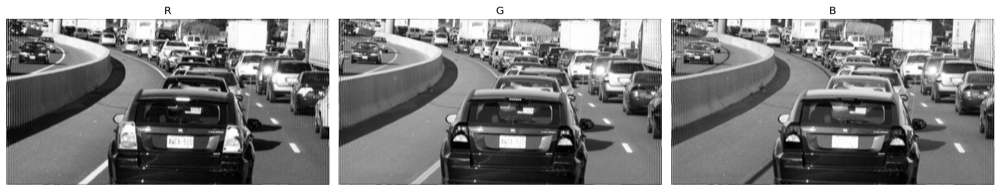

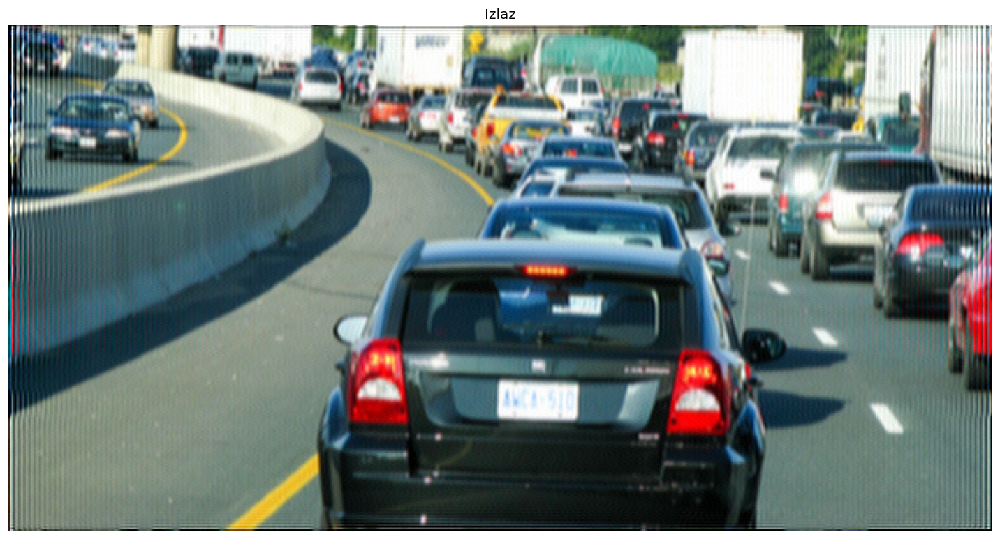

In [16]:
out = zeros(shape(f))
out[:,:,0] = restore_degradation(f[:,:,0], F_DEG, 'ideal')
out[:,:,1] = restore_degradation(f[:,:,1], F_DEG, 'ideal')
out[:,:,2] = restore_degradation(f[:,:,2], F_DEG, 'ideal')
out[:,:,3] = restore_degradation(f[:,:,3], F_DEG, 'ideal')


fig, axes = plt.subplots(ncols=3, figsize=(16,8), dpi=120)
ax = axes.ravel()

ax[0].imshow(out[:,:,0], cmap='gray'); ax[0].set_title('R'); ax[0].axis('off')
ax[1].imshow(out[:,:,1], cmap='gray'); ax[1].set_title('G'); ax[1].axis('off')
ax[2].imshow(out[:,:,2], cmap='gray'); ax[2].set_title('B'); ax[2].axis('off')

plt.tight_layout()
plt.show()

figure(figsize=(16,8), dpi=120); imshow(out, cmap='jet'); gca().axis('off'); gca().set_title('Izlaz')
plt.show()

Detektovane tablice: AWCA 510

Interesantna funkcija u ovom zadatku predstavlja funkcija threshold_lowpass. Ideja iza te funkcije je činjenica da bi bilo jako praktično imati funkciju za restauraciju kojoj su argumenti samo ulazna slika i degradaciona funkcija. Ukoliko se umesto Vinerovog (korišćenog u ovom primeru jer malo slabije potiskuje visoke učestanosti koje su nam potrebne za detekciju tablica) koristi idealni low pass filtar, detektovani prag se direktno koristi za realizaciju idealnog low pass filtra. 

Moguće poboljšanje bi bilo realizovati i podršku za Vinerov filtar, odnosno na osnovu parametra radijusa idealnog filtra odrediti konstantu k u Vinerovom filtru.

Primer funkcionalnosti funkcije threshold_lowpass gde se prosleđuje samo degradaciona funkcija i ulazna slika:

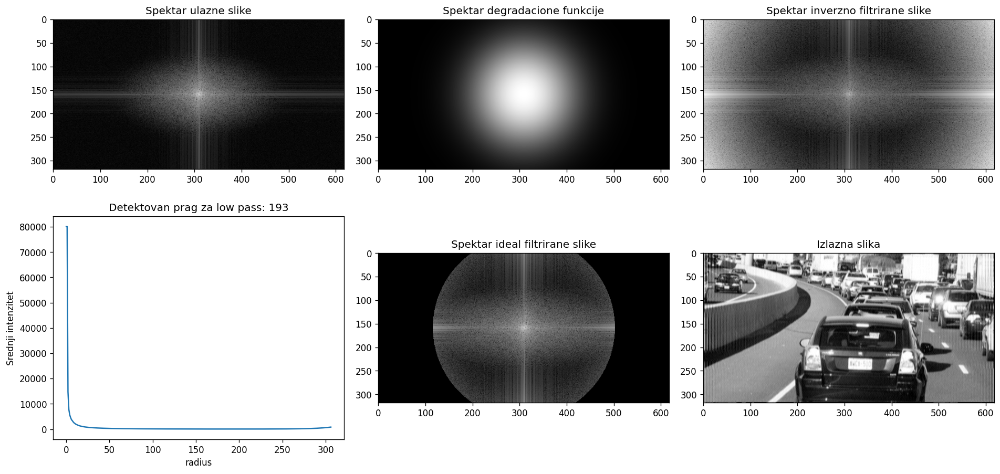

In [17]:
F_DEG = lpfilter('gaussian', M, N, 70)

out = restore_degradation(f[:,:,0], F_DEG, 'ideal', show_results=True) # dev : 70, k = 0.01

### Zadatak 4

In [18]:
import time

Za kreiranje korelacione funkcije (koja za simetrične filtre proizvodi isti rezultat kao i konvoluciona funkcija) inicijalno postoje veliki problemi u vremenu izvršavanja. Generički algoritam koji 'prati' formulu konvolucije ima katastrofalnu vremensku kompleksnost (O(N * M * radius^2)), gde su M i N dimenzije slike a radius širina maske (2radius+1 x 2radius+1). Međutim, vremenska složenost se može značajno umanjiti tako da ne zavisi kvadratno od radijusa već linearno ukoliko je filtar separabilan. 

Dvodimenzionalni filtar je separabilan ukoliko je moguće matricu filtra MxN zameniti sa dva jednodimenzionalna filtra dimenzija Mx1 i 1xN tako da množenjem tog reda/kolone određenim koeficijentima možemo da rekreiramo originalnu matricu filtra. 

Drugim rečima, filtar je separabilan ukoliko su njegovi redovi/kolone međusobno linearno zavisni, odnosno ukoliko je rang filtra 1.

Gausov filtar jeste separabilan. Potrebno je separirati filtar na dva linijska filtra, normirati ta dva filtra i izvršiti korelaciju odvojeno. Time bi vremenska složenost spala na O(N * M * (2 * radius))

Očekuje se da u frekvencijskom domenu, teorijski, vreme izvršavanja filtarske funkcije bude konstantno i nezavisno od radijusa maske, dok se u prostornom domenu, nakon primene separabilnosti, očekuje da vreme izvršavanja filtarske funkcije raste linearno.

In [19]:
# Funkcija koja koristi ugradjenu funkciju ndimage.correlate (za poredjenje sa napravljenom funkcijom)

def filter_gauss_v2(img, radius, sigma):
    
    [M, N] = shape(img)
        
    # figure(figsize=(16,8)); imshow(img_stretched, cmap='gray'); gca().axis('off'); plt.show()
    
    # Kreiranje prostorne maske
    x = list(range(-radius,radius+1))
    y = list(range(-radius,radius+1))

    X, Y = meshgrid(x, y)
    
    gauss_mask = exp(-(np.square(X)+np.square(Y))/(np.square(sigma)*2))
    gauss_mask_norm = gauss_mask/sum(gauss_mask.flatten())
    
    out = ndimage.correlate(img, gauss_mask_norm, mode='nearest')                
    return out

In [20]:
def filter_gauss(img, radius, sigma):
    
    [M, N] = shape(img)
    
    # Prosirivanje slike
    img_stretched = zeros([M+radius*2, N+radius*2], dtype='float')
    img_stretched[radius:M+radius, radius:N+radius] = img
    
    for i in range(radius):
        img_stretched[i,radius:(radius+N)] = img[0,:]
        img_stretched[(i+M+radius),radius:(radius+N)] = img[(M-1),:]
        img_stretched[radius:(radius+M),i] = img[:,0]
        img_stretched[radius:(radius+M),(i+N+radius)] = img[:,(N-1)]
    
    img_stretched[0:radius,0:radius] = img[0,0]
    img_stretched[(radius+M):(2*radius+M),0:radius] = img[M-1,0]
    img_stretched[0:radius,(radius+N):(2*radius+N)] = img[0,N-1]
    img_stretched[(radius+M):(2*radius+M),(radius+N):(2*radius+N)] = img[M-1,N-1]
        
    # figure(figsize=(16,8)); imshow(img_stretched, cmap='gray'); gca().axis('off'); plt.show()
    
    # Kreiranje prostorne maske
    x = list(range(-radius,radius+1))
    y = list(range(-radius,radius+1))

    X, Y = meshgrid(x, y)
    
    # Separiranje 2D filtra na dva 1D filtra
    gauss_mask_x = exp(-(np.square(x))/(np.square(sigma)*2))
    gauss_mask_y = exp(-(np.square(y))/(np.square(sigma)*2))
    
    # Normalizacija 1D filtara
    gauss_mask_x = gauss_mask_x/sum(gauss_mask_x.flatten())
    gauss_mask_y = gauss_mask_y/sum(gauss_mask_y.flatten())
    
    # Konvolucija
    out_horizontal = zeros(shape(img_stretched))
    out_horizontal_stretched = zeros(shape(img_stretched))
    out_final = zeros(shape(img_stretched))
    
    for i in range(radius, M+radius):
        for j in range(radius, N+radius):
            # print('Konvolucija za indeks ' + str(i) + ', ' + str(j), end='\r')
            sum_ = sum(np.multiply(img_stretched[i, j-radius:j+radius+1], gauss_mask_x).flatten())
            out_horizontal[i, j] = sum_
            
    out_horizontal_stretched[radius:(radius+M),radius:(radius+N)] = out_horizontal[radius:radius+M,radius:radius+N];
    
    # Ponovo radimo prosirivanje jer se izmenila slika pa su se i ivice promenile
    for i in range(radius):
        out_horizontal_stretched[i,radius:(radius+N)] = out_horizontal[radius,radius:radius+N]#top
        out_horizontal_stretched[(i+M+radius),radius:(radius+N)] = out_horizontal[(M+radius-1),radius:radius+N]#bottom
        out_horizontal_stretched[radius:(radius+M),i] = out_horizontal[radius:radius+M,0]#left
        out_horizontal_stretched[radius:(radius+M),(i+N+radius)] = out_horizontal[radius:radius+M,(N+radius-1)]#right
    
    out_horizontal_stretched[0:radius,0:radius] = out_horizontal[0,0]
    out_horizontal_stretched[(radius+M):(2*radius+M),0:radius] = out_horizontal[M-1,0]
    out_horizontal_stretched[0:radius,(radius+N):(2*radius+N)] = out_horizontal[0,N-1]
    out_horizontal_stretched[(radius+M):(2*radius+M),(radius+N):(2*radius+N)] = out_horizontal[M-1,N-1]
    
    for i in range(radius, M+radius):
        for j in range(radius, N+radius):
            # print('Konvolucija za indeks ' + str(i) + ', ' + str(j), end='\r')
            
            # Funkcija reshape prebacuje matricu kolonu u matricu vrstu, inace ce funkcija multiply matricno mnoziti
            sum_ = sum(multiply(out_horizontal_stretched[i-radius:i+radius+1, j], gauss_mask_y.reshape(1,2*radius+1)).flatten())
            out_final[i, j] = sum_
    
    return out_final[radius:M+radius, radius:N+radius]

U frekvencijskom domenu nije potrebno separirati filtar jer brzina izvršavanja teoretski ne zavisi od radijusa maske. 

In [21]:
def filter_gauss_freq(img, radius, sigma):
    
    [M, N] = shape(img)
    
    P = 2*M-1
    Q = 2*M-1
    
    img_stretched = np.pad(img, [(0,M-1),(0,N-1)], mode='reflect')
    
    # figure(); imshow(img_stretched, cmap='gray')
    
    # Kreiranje prostorne maske
    x = list(range(-radius,radius+1))
    y = list(range(-radius,radius+1))

    X, Y = meshgrid(x, y)
    
    gauss_mask = exp(-(np.square(X)+np.square(Y))/(np.square(sigma)*2))
    gauss_mask_norm = gauss_mask/sum(gauss_mask.flatten())
    
    gauss_mask_extended = zeros([P, Q])
    gauss_mask_extended[0:2*radius+1, 0:2*radius+1] = gauss_mask_norm

    # FFT 
    IMG_STRETCHED = fftshift(fft2(img_stretched))
    H = fftshift(fft2(gauss_mask_extended))
    
    # Mnozenje u FFT i racunanje rezultata
    OUT_STRETCHED = IMG_STRETCHED * H
    out_stretched = real(ifft2(ifftshift(OUT_STRETCHED)))
    
    out = out_stretched[radius:M+radius, radius:N+radius]
    out[out < 0] = 0
    out[out > 1] = 1
    
    return out

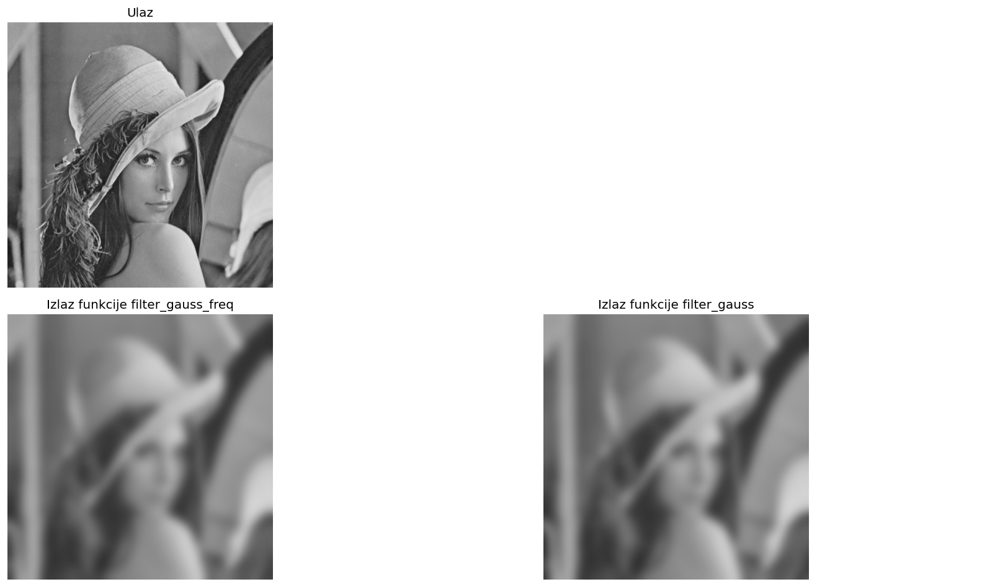

In [22]:
f = img_as_float(imread('../sekvence/lena.tif'))

radius = 30

g = filter_gauss_freq(f, radius, radius/3)
g1 = filter_gauss(f, radius, radius/3)

fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(16,8), dpi=120)
ax = axes.ravel()


ax[0].imshow(f, cmap='gray', vmin=0,vmax=1); ax[0].axis('off'); ax[0].set_title('Ulaz')
ax[1].axis('off')
ax[2].imshow(g, cmap='gray', vmin=0,vmax=1); ax[2].axis('off'); ax[2].set_title('Izlaz funkcije filter_gauss_freq')
ax[3].imshow(g1, cmap='gray',vmin=0,vmax=1); ax[3].axis('off'); ax[3].set_title('Izlaz funkcije filter_gauss'); ax[3].axis('off')

plt.tight_layout()
plt.show()

In [23]:
print('Maksimalna razlika piksela slike: ' +  str(round(max(abs(g-g1).flatten()), 3)))

Maksimalna razlika piksela slike: 0.089


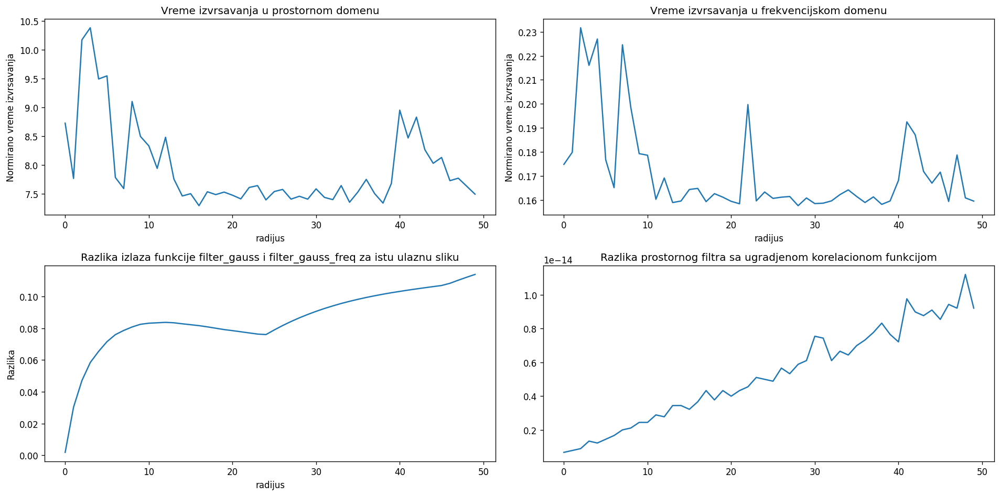

In [24]:
f = img_as_float(imread('../sekvence/lena.tif'))

times_space = zeros(50) # Vremena izvrsavanja u prostornom domenu
times_freq = zeros(50)  # Vremena izvrsavanja u frekvencijskom domenu
image_diff = zeros(50)  # Razlika izmedju izlaza funkcije u prostornom domenu i frekvencijskom domenu
space_diff = zeros(50)  # Razlika izmedju izlaza funkcije u prostornom domenu i filtriranja u prostornom domenu ugradjenom funkcijom

[M, N] = shape(f)

for radius in range(1, 51):
    
    print('Racunanje vremena izvrsavanja za radius ' + str(radius), end='\r')
    
    # Racunanje u prostornom domenu
    start_time = time.time()
    img_out_space = filter_gauss(f, radius, radius/3)
    end_time = time.time()
    
    times_space[radius-1] = (end_time - start_time)
    
    # Racunanje u frekvencijskom domenu
    start_time = time.time()
    img_out_freq = filter_gauss_freq(f, radius, radius/3)
    end_time = time.time()
    
    times_freq[radius-1] = (end_time - start_time)
    
    image_diff[radius-1] = max(abs(img_out_space - img_out_freq).flatten())
    
    # Razlika prostornog filtra sa ugradjenom funkcijom
    space_diff[radius-1] = max(abs(img_out_space - filter_gauss_v2(f, radius, radius/3)).flatten())

fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(16,8), dpi=120)
ax = axes.ravel()

ax[0].plot(times_space); ax[0].set_xlabel('radijus'); ax[0].set_ylabel('Normirano vreme izvrsavanja')
ax[0].set_title('Vreme izvrsavanja u prostornom domenu')
ax[1].plot(times_freq); ax[1].set_xlabel('radijus'); ax[1].set_ylabel('Normirano vreme izvrsavanja')
ax[1].set_title('Vreme izvrsavanja u frekvencijskom domenu')
ax[2].plot(image_diff); ax[2].set_xlabel('radijus'); ax[2].set_ylabel('Razlika')
ax[2].set_title('Razlika izlaza funkcije filter_gauss i filter_gauss_freq za istu ulaznu sliku')
ax[3].plot(space_diff); ax[3].set_title('Razlika prostornog filtra sa ugradjenom korelacionom funkcijom')


plt.tight_layout()
plt.show()

Vreme izvršavanja u prostornom domenu, očekivano, ima tendenciju blagog porasta. Ukoliko separabilnost filtra ne bi bila iskorišćena, tendencija bi bila dosta uočljivija jer bi rast bio kvadratan. S druge strane, vreme izvršavanja u frekvencijskom domenu nema tendenciju rasta. 

Same velike razlike u brzini postoje i jako su izražene u ovom primeru, postoji još mnogo potencijalnih optimizacija za funkciju za računanje u prostornom domenu, međutim, ključno je uočiti konstantnost u vremenu izvršavanja funkcije filter_gauss_freq u odnosu na tendenciju (teorijski očekivanu) linearnog rasta vremena izvršavanja funkcije filter_gauss sa porastom radijusa.